### Installation


In [1]:
!pip install pycaret

     |████████████████████████████████| 320 kB 5.3 MB/s 
     |████████████████████████████████| 262 kB 39.9 MB/s 
     |████████████████████████████████| 1.7 MB 43.6 MB/s 
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Installing backend dependencies ... done
    Preparing wheel metadata ... done
     |████████████████████████████████| 56 kB 4.1 MB/s 
     |████████████████████████████████| 88 kB 6.9 MB/s 
     |████████████████████████████████| 167 kB 56.2 MB/s 
     |████████████████████████████████| 120 kB 46.6 MB/s 
     |████████████████████████████████| 2.0 MB 26.9 MB/s 
     |████████████████████████████████| 6.8 MB 32.0 MB/s 
     |████████████████████████████████| 1.3 MB 41.5 MB/s 
     |████████████████████████████████| 17.8 MB 503 kB/s 
     |████████████████████████████████| 102 kB 10.3 MB/s 
     |████████████████████████████████| 10.9 MB 39.9 MB/s 
     |████████████████████████████████| 690 kB 39.5 MB/s 
     |█████████████████

In [2]:
!pip install markupsafe==2.0.1

  Attempting uninstall: markupsafe
    Found existing installation: MarkupSafe 2.1.1
    Uninstalling MarkupSafe-2.1.1:
      Successfully uninstalled MarkupSafe-2.1.1
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pandas-profiling 3.2.0 requires markupsafe~=2.1.1, but you have markupsafe 2.0.1 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0.8.3 which is incompatible.


In [3]:
!pip install Jinja2

In [4]:
!pip install --upgrade gensim

     |████████████████████████████████| 24.1 MB 1.3 MB/s 
  Attempting uninstall: gensim
    Found existing installation: gensim 3.6.0
    Uninstalling gensim-3.6.0:
      Successfully uninstalled gensim-3.6.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
pycaret 2.3.10 requires gensim<4.0.0, but you have gensim 4.2.0 which is incompatible.


In [5]:
!pip install transformers

     |████████████████████████████████| 4.2 MB 5.4 MB/s 
     |████████████████████████████████| 84 kB 3.2 MB/s 
     |████████████████████████████████| 6.6 MB 35.0 MB/s 


### Upload files

In [ ]:
from google.colab import files
uploaded = files.upload()

Saving merge_clean_v5.csv to merge_clean_v5.csv


In [ ]:
uploaded_sec = files.upload()

Saving raw.csv to raw.csv


In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


### Imports


In [6]:
import os
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import itertools
import collections
import re
import networkx
import numpy as np
import ast
import nltk
import gensim
from sklearn.feature_extraction.text import TfidfVectorizer
from sklearn.preprocessing import LabelEncoder
from gensim.models.phrases import Phrases
from wordcloud import WordCloud

from sklearn.model_selection import train_test_split
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import confusion_matrix
from sklearn.metrics import plot_confusion_matrix
from imblearn.over_sampling import SMOTE 
from imblearn.under_sampling import RandomUnderSampler
from sklearn.metrics import classification_report, confusion_matrix, accuracy_score
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import LinearSVC


import time

In [7]:
#from autosklearn.experimental.askl2 import AutoSklearn2Classifier
from pycaret.utils import enable_colab
enable_colab()

Colab mode enabled.


In [8]:
total_filename = '/content/merge_clean_v5.csv'
orig_filename = '/content/raw.csv'

### Loading DF

In [9]:
df = pd.read_csv(total_filename, encoding="utf-8")
df = df.set_index('orig_index')
df = df.sort_values(by=['orig_index'])
orig_df = pd.read_csv(orig_filename, encoding="utf-8")
orig_df['verdict'] = 'INVALID'

In [10]:
orig_indexes = df.index
for i in orig_indexes:
  tweet = df.loc[i].tweet
  indexes = orig_df.loc[orig_df.tweet == tweet].index
  for j in indexes:
    orig_df.at[j,'verdict'] = df.loc[i].verdict


df = orig_df
df

,author id,username,created_at,geo,id,lang,like_count,quote_count,reply_count,retweet_count,source,tweet,verdict
0,630857697.0,PIACaraga,2021-09-21 23:53:36+00:00,,1.440000e+18,tl,0.0,0.0,0.0,2.0,Twitter for Android,"RT @pcoogov: TINGNAN: Kahapon, Setyembre 20, i...",TRUE
1,630857697.0,PIACaraga,2021-09-21 23:53:27+00:00,,1.440000e+18,tl,0.0,0.0,0.0,6.0,Twitter for Android,RT @pcoogov: TINGNAN: Nakatanggap ng additiona...,TRUE
2,630857697.0,PIACaraga,2021-09-21 23:53:17+00:00,,1.440000e+18,tl,0.0,0.0,0.0,3.0,Twitter for Android,"RT @pcoogov: TINGNAN: Nitong Lunes, Setyembre ...",INVALID
3,630857697.0,PIACaraga,2021-09-21 23:52:36+00:00,,1.440000e+18,tl,0.0,0.0,0.0,3.0,Twitter for Android,RT @pcoogov: TINGNAN: Ipinabatid ni Presidenti...,INVALID
4,630857697.0,PIACaraga,2021-09-21 23:52:23+00:00,,1.440000e+18,tl,0.0,0.0,0.0,2.0,Twitter for Android,"RT @pcoogov: PANOORIN: Kahapon, Setyembre 20, ...",TRUE
...,...,...,...,...,...,...,...,...,...,...,...,...,...
9232,1111.0,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,The Department of Health (DOH) said that child...,FALSE
9233,1111.0,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Filipino official branded poor people a ‘burde...,FALSE
9234,1111.0,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Presidential Spokesperson Harry Roque said the...,FALSE
9235,1111.0,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Clinical trials in Indonesia recorded Sinovac’...,FALSE


In [11]:
df.verdict.value_counts()

INVALID         4017
TRUE            3099
MOSTLY_TRUE     1309
INVALIDT         492
MOSTLY_FALSE     170
FALSE            150
Name: verdict, dtype: int64

In [12]:
df = df[(df.verdict == 'TRUE') | (df.verdict == 'FALSE') | (df.verdict == 'MOSTLY_TRUE') | (df.verdict == 'MOSTLY_FALSE') | (df.verdict == 'HALF_TRUE')]
df = df.reset_index()
df = df.drop(columns=['index'])
#df['verdict'] = df['verdict'].astype('bool')
df

,author id,username,created_at,geo,id,lang,like_count,quote_count,reply_count,retweet_count,source,tweet,verdict
0,6.308577e+08,PIACaraga,2021-09-21 23:53:36+00:00,,1.440000e+18,tl,0.0,0.0,0.0,2.0,Twitter for Android,"RT @pcoogov: TINGNAN: Kahapon, Setyembre 20, i...",TRUE
1,6.308577e+08,PIACaraga,2021-09-21 23:53:27+00:00,,1.440000e+18,tl,0.0,0.0,0.0,6.0,Twitter for Android,RT @pcoogov: TINGNAN: Nakatanggap ng additiona...,TRUE
2,6.308577e+08,PIACaraga,2021-09-21 23:52:23+00:00,,1.440000e+18,tl,0.0,0.0,0.0,2.0,Twitter for Android,"RT @pcoogov: PANOORIN: Kahapon, Setyembre 20, ...",TRUE
3,1.280000e+18,YamauchiElena,2021-09-21 20:45:11+00:00,,1.440000e+18,tl,0.0,0.0,0.0,6.0,Twitter for iPhone,RT @pcoogov: TINGNAN: Nakatanggap ng additiona...,TRUE
4,1.340000e+18,greg_kassie,2021-09-21 16:28:08+00:00,,1.440000e+18,tl,0.0,0.0,0.0,34.0,Twitter for Android,RT @WinGatchalian74: Dapat mayroong sapat na a...,MOSTLY_TRUE
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4723,1.111000e+03,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,The Department of Health (DOH) said that child...,FALSE
4724,1.111000e+03,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Filipino official branded poor people a ‘burde...,FALSE
4725,1.111000e+03,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Presidential Spokesperson Harry Roque said the...,FALSE
4726,1.111000e+03,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Clinical trials in Indonesia recorded Sinovac’...,FALSE


In [13]:
df['RT'] = False
df['RTUser'] = 'NA'
df['source_user'] = 'NA'
df['target_user'] = 'NA'
df['mentions'] = 'NA'

###Segregating People Who Retweeted, and the Usernames. Adding into source_user and target_user as well

In [14]:
for i in df.index:
  i = int(i)
  row = df.iloc[i]
  username_df = row.tweet.split(" ")
  if username_df[0] == 'RT':
    username_rt = str(username_df[1])[1:-1]
    df.at[i,'RT'] = True
    df.at[i,'RTUser'] = username_rt
    df.at[i,'source_user'] = username_rt
    df.at[i,'target_user'] = row.username
    
df

,author id,username,created_at,geo,id,lang,like_count,quote_count,reply_count,retweet_count,source,tweet,verdict,RT,RTUser,source_user,target_user,mentions
0,6.308577e+08,PIACaraga,2021-09-21 23:53:36+00:00,,1.440000e+18,tl,0.0,0.0,0.0,2.0,Twitter for Android,"RT @pcoogov: TINGNAN: Kahapon, Setyembre 20, i...",TRUE,True,pcoogov,pcoogov,PIACaraga,NA
1,6.308577e+08,PIACaraga,2021-09-21 23:53:27+00:00,,1.440000e+18,tl,0.0,0.0,0.0,6.0,Twitter for Android,RT @pcoogov: TINGNAN: Nakatanggap ng additiona...,TRUE,True,pcoogov,pcoogov,PIACaraga,NA
2,6.308577e+08,PIACaraga,2021-09-21 23:52:23+00:00,,1.440000e+18,tl,0.0,0.0,0.0,2.0,Twitter for Android,"RT @pcoogov: PANOORIN: Kahapon, Setyembre 20, ...",TRUE,True,pcoogov,pcoogov,PIACaraga,NA
3,1.280000e+18,YamauchiElena,2021-09-21 20:45:11+00:00,,1.440000e+18,tl,0.0,0.0,0.0,6.0,Twitter for iPhone,RT @pcoogov: TINGNAN: Nakatanggap ng additiona...,TRUE,True,pcoogov,pcoogov,YamauchiElena,NA
4,1.340000e+18,greg_kassie,2021-09-21 16:28:08+00:00,,1.440000e+18,tl,0.0,0.0,0.0,34.0,Twitter for Android,RT @WinGatchalian74: Dapat mayroong sapat na a...,MOSTLY_TRUE,True,WinGatchalian74,WinGatchalian74,greg_kassie,NA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4723,1.111000e+03,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,The Department of Health (DOH) said that child...,FALSE,False,NA,NA,NA,NA
4724,1.111000e+03,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Filipino official branded poor people a ‘burde...,FALSE,False,NA,NA,NA,NA
4725,1.111000e+03,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Presidential Spokesperson Harry Roque said the...,FALSE,False,NA,NA,NA,NA
4726,1.111000e+03,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Clinical trials in Indonesia recorded Sinovac’...,FALSE,False,NA,NA,NA,NA


In [15]:
def remove_rt(tweet_row):
  tweet = ''
  split_str = tweet_row.split(" ")
  if split_str[0]=='RT':
    split_str.pop(0)
    split_str.pop(0)
    tweet = ' '.join([word for word in split_str])
    return tweet
  else:
    return tweet_row

In [16]:
df['tweet'] = df['tweet'].apply(lambda x: remove_rt(x))
df

,author id,username,created_at,geo,id,lang,like_count,quote_count,reply_count,retweet_count,source,tweet,verdict,RT,RTUser,source_user,target_user,mentions
0,6.308577e+08,PIACaraga,2021-09-21 23:53:36+00:00,,1.440000e+18,tl,0.0,0.0,0.0,2.0,Twitter for Android,"TINGNAN: Kahapon, Setyembre 20, inilabas ni @n...",TRUE,True,pcoogov,pcoogov,PIACaraga,NA
1,6.308577e+08,PIACaraga,2021-09-21 23:53:27+00:00,,1.440000e+18,tl,0.0,0.0,0.0,6.0,Twitter for Android,TINGNAN: Nakatanggap ng additional doses ng Pf...,TRUE,True,pcoogov,pcoogov,PIACaraga,NA
2,6.308577e+08,PIACaraga,2021-09-21 23:52:23+00:00,,1.440000e+18,tl,0.0,0.0,0.0,2.0,Twitter for Android,"PANOORIN: Kahapon, Setyembre 20, nagbigay ng u...",TRUE,True,pcoogov,pcoogov,PIACaraga,NA
3,1.280000e+18,YamauchiElena,2021-09-21 20:45:11+00:00,,1.440000e+18,tl,0.0,0.0,0.0,6.0,Twitter for iPhone,TINGNAN: Nakatanggap ng additional doses ng Pf...,TRUE,True,pcoogov,pcoogov,YamauchiElena,NA
4,1.340000e+18,greg_kassie,2021-09-21 16:28:08+00:00,,1.440000e+18,tl,0.0,0.0,0.0,34.0,Twitter for Android,Dapat mayroong sapat na abiso sa mga lugar na ...,MOSTLY_TRUE,True,WinGatchalian74,WinGatchalian74,greg_kassie,NA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4723,1.111000e+03,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,The Department of Health (DOH) said that child...,FALSE,False,NA,NA,NA,NA
4724,1.111000e+03,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Filipino official branded poor people a ‘burde...,FALSE,False,NA,NA,NA,NA
4725,1.111000e+03,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Presidential Spokesperson Harry Roque said the...,FALSE,False,NA,NA,NA,NA
4726,1.111000e+03,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Clinical trials in Indonesia recorded Sinovac’...,FALSE,False,NA,NA,NA,NA


### Segregating Mentions and placing the remaining source_user and target_user

In [17]:
for i in df.index:
  row = df.iloc[i]
  if row.RT == False:
    username_s = row.username
    mentions = [word[1:] for word in row.tweet.split(" ") if "@" in word]
    df.at[i,'source_user'] = username_s
    if mentions != []:
      df.at[i,'mentions'] = mentions
      df.at[i,'target_user'] = mentions
    

df

,author id,username,created_at,geo,id,lang,like_count,quote_count,reply_count,retweet_count,source,tweet,verdict,RT,RTUser,source_user,target_user,mentions
0,6.308577e+08,PIACaraga,2021-09-21 23:53:36+00:00,,1.440000e+18,tl,0.0,0.0,0.0,2.0,Twitter for Android,"TINGNAN: Kahapon, Setyembre 20, inilabas ni @n...",TRUE,True,pcoogov,pcoogov,PIACaraga,NA
1,6.308577e+08,PIACaraga,2021-09-21 23:53:27+00:00,,1.440000e+18,tl,0.0,0.0,0.0,6.0,Twitter for Android,TINGNAN: Nakatanggap ng additional doses ng Pf...,TRUE,True,pcoogov,pcoogov,PIACaraga,NA
2,6.308577e+08,PIACaraga,2021-09-21 23:52:23+00:00,,1.440000e+18,tl,0.0,0.0,0.0,2.0,Twitter for Android,"PANOORIN: Kahapon, Setyembre 20, nagbigay ng u...",TRUE,True,pcoogov,pcoogov,PIACaraga,NA
3,1.280000e+18,YamauchiElena,2021-09-21 20:45:11+00:00,,1.440000e+18,tl,0.0,0.0,0.0,6.0,Twitter for iPhone,TINGNAN: Nakatanggap ng additional doses ng Pf...,TRUE,True,pcoogov,pcoogov,YamauchiElena,NA
4,1.340000e+18,greg_kassie,2021-09-21 16:28:08+00:00,,1.440000e+18,tl,0.0,0.0,0.0,34.0,Twitter for Android,Dapat mayroong sapat na abiso sa mga lugar na ...,MOSTLY_TRUE,True,WinGatchalian74,WinGatchalian74,greg_kassie,NA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4723,1.111000e+03,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,The Department of Health (DOH) said that child...,FALSE,False,NA,poynter,NA,NA
4724,1.111000e+03,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Filipino official branded poor people a ‘burde...,FALSE,False,NA,poynter,NA,NA
4725,1.111000e+03,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Presidential Spokesperson Harry Roque said the...,FALSE,False,NA,poynter,NA,NA
4726,1.111000e+03,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Clinical trials in Indonesia recorded Sinovac’...,FALSE,False,NA,poynter,NA,NA


###Dropping the columns not needed for the model

In [18]:
df = df.drop(columns=['author id', 'created_at', 'RTUser', 'mentions', 'source' ])
df

,username,geo,id,lang,like_count,quote_count,reply_count,retweet_count,tweet,verdict,RT,source_user,target_user
0,PIACaraga,,1.440000e+18,tl,0.0,0.0,0.0,2.0,"TINGNAN: Kahapon, Setyembre 20, inilabas ni @n...",TRUE,True,pcoogov,PIACaraga
1,PIACaraga,,1.440000e+18,tl,0.0,0.0,0.0,6.0,TINGNAN: Nakatanggap ng additional doses ng Pf...,TRUE,True,pcoogov,PIACaraga
2,PIACaraga,,1.440000e+18,tl,0.0,0.0,0.0,2.0,"PANOORIN: Kahapon, Setyembre 20, nagbigay ng u...",TRUE,True,pcoogov,PIACaraga
3,YamauchiElena,,1.440000e+18,tl,0.0,0.0,0.0,6.0,TINGNAN: Nakatanggap ng additional doses ng Pf...,TRUE,True,pcoogov,YamauchiElena
4,greg_kassie,,1.440000e+18,tl,0.0,0.0,0.0,34.0,Dapat mayroong sapat na abiso sa mga lugar na ...,MOSTLY_TRUE,True,WinGatchalian74,greg_kassie
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4723,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,The Department of Health (DOH) said that child...,FALSE,False,poynter,NA
4724,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Filipino official branded poor people a ‘burde...,FALSE,False,poynter,NA
4725,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Presidential Spokesperson Harry Roque said the...,FALSE,False,poynter,NA
4726,poynter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,Clinical trials in Indonesia recorded Sinovac’...,FALSE,False,poynter,NA


### Duplicating rows with multiple target_users

In [19]:
x = len(df.index)

for i in df.index:
  row = df.iloc[i]
  if type(row.target_user) is list:
    for j in range(1,len(row.target_user)):
      df = df.append(row,ignore_index=True)
      if "@" in row.target_user[j]:
        df.at[x,'target_user'] = df.at[x,'target_user'] = row.target_user[j][1:]
      else:
        df.at[x,'target_user'] = row.target_user[j]
      x += 1
    df.at[i,'target_user'] = row.target_user[0]


df

,username,geo,id,lang,like_count,quote_count,reply_count,retweet_count,tweet,verdict,RT,source_user,target_user
0,PIACaraga,,1.440000e+18,tl,0.0,0.0,0.0,2.0,"TINGNAN: Kahapon, Setyembre 20, inilabas ni @n...",TRUE,True,pcoogov,PIACaraga
1,PIACaraga,,1.440000e+18,tl,0.0,0.0,0.0,6.0,TINGNAN: Nakatanggap ng additional doses ng Pf...,TRUE,True,pcoogov,PIACaraga
2,PIACaraga,,1.440000e+18,tl,0.0,0.0,0.0,2.0,"PANOORIN: Kahapon, Setyembre 20, nagbigay ng u...",TRUE,True,pcoogov,PIACaraga
3,YamauchiElena,,1.440000e+18,tl,0.0,0.0,0.0,6.0,TINGNAN: Nakatanggap ng additional doses ng Pf...,TRUE,True,pcoogov,YamauchiElena
4,greg_kassie,,1.440000e+18,tl,0.0,0.0,0.0,34.0,Dapat mayroong sapat na abiso sa mga lugar na ...,MOSTLY_TRUE,True,WinGatchalian74,greg_kassie
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4862,roysant51162134,,1.440000e+18,tl,0.0,0.0,1.0,0.0,@EdsonCGuido @ABSCBNNews habang dumadami nabab...,MOSTLY_FALSE,False,roysant51162134,ABSCBNNews
4863,dzrhnews,,1.440000e+18,tl,0.0,0.0,0.0,0.0,Pakiusap na payagan na rin ang mga naka-unang ...,TRUE,False,dzrhnews,liezel_once
4864,GrowlHarhar,,1.440000e+18,tl,0.0,0.0,0.0,0.0,@CityMouse14 @inquirerdotnet @KAguilarINQ Ikaw...,MOSTLY_TRUE,False,GrowlHarhar,inquirerdotnet
4865,GrowlHarhar,,1.440000e+18,tl,0.0,0.0,0.0,0.0,@CityMouse14 @inquirerdotnet @KAguilarINQ Ikaw...,MOSTLY_TRUE,False,GrowlHarhar,KAguilarINQ


###Lower case all words

In [20]:
df.tweet = df['tweet'].apply(lambda x: x.lower())
df.tweet

0       tingnan: kahapon, setyembre 20, inilabas ni @n...
1       tingnan: nakatanggap ng additional doses ng pf...
2       panoorin: kahapon, setyembre 20, nagbigay ng u...
3       tingnan: nakatanggap ng additional doses ng pf...
4       dapat mayroong sapat na abiso sa mga lugar na ...
                              ...                        
4862    @edsoncguido @abscbnnews habang dumadami nabab...
4863    pakiusap na payagan na rin ang mga naka-unang ...
4864    @citymouse14 @inquirerdotnet @kaguilarinq ikaw...
4865    @citymouse14 @inquirerdotnet @kaguilarinq ikaw...
4866            @jopszxsz @amayygamayy bakuna para gwapo?
Name: tweet, Length: 4867, dtype: object

### Removal of Stopwords and Links


In [21]:
import nltk
nltk.download('stopwords')
#English Stopwords
from nltk.corpus import stopwords
stop = stopwords.words('english')
stop.sort()

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Unzipping corpora/stopwords.zip.


In [22]:
#English Stopwords
df.tweet = df['tweet'].apply(lambda x: ' '.join([word for word in x.split(" ") if word not in (stop)]))
df.tweet

0       tingnan: kahapon, setyembre 20, inilabas ni @n...
1       tingnan: nakatanggap ng additional doses ng pf...
2       panoorin: kahapon, setyembre 20, nagbigay ng u...
3       tingnan: nakatanggap ng additional doses ng pf...
4       dapat mayroong sapat na abiso sa mga lugar na ...
                              ...                        
4862    @edsoncguido @abscbnnews habang dumadami nabab...
4863    pakiusap na payagan na rin ang mga naka-unang ...
4864    @citymouse14 @inquirerdotnet @kaguilarinq ikaw...
4865    @citymouse14 @inquirerdotnet @kaguilarinq ikaw...
4866            @jopszxsz @amayygamayy bakuna para gwapo?
Name: tweet, Length: 4867, dtype: object

In [23]:
#Filipino Stopwords
fil_stop = ["akin","aking","ako","alin","am","amin","aming","ang","ano","anumang","apat","at","atin","ating","ay","bababa","bago","bakit","bawat","bilang","dahil","dalawa","dapat","din","dito","doon","gagawin","gayunman","ginagawa","ginawa","ginawang","gumawa","gusto","habang","hanggang","hindi","huwag","iba","ibaba","ibabaw","ibig","ikaw","ilagay","ilalim","ilan","inyong","isa","isang","itaas","ito","iyo","iyon","iyong","ka","kahit","kailangan","kailanman","kami","kanila","kanilang","kanino","kanya","kanyang","kapag","kapwa","karamihan","katiyakan","katulad","kaya","kaysa","ko","kong","kulang","kumuha","kung","laban","lahat","lamang","likod","lima","maaari","maaaring","maging","mahusay","makita","marami","marapat","masyado","may","mayroon","mga","minsan","mismo","mula","muli","na","nabanggit","naging","nagkaroon","nais","nakita","namin","napaka","narito","nasaan","ng","ngayon","ni","nila","nilang","nito","niya","niyang","noon","o","pa","paano","pababa","paggawa","pagitan","pagkakaroon","pagkatapos","palabas","pamamagitan","panahon","pangalawa","para","paraan","pareho","pataas","pero","pumunta","pumupunta","sa","saan","sabi","sabihin","sarili","sila","sino","siya","tatlo","tayo","tulad","tungkol","una","walang",'in']

In [24]:
stop = fil_stop
df.tweet = df['tweet'].apply(lambda x: ' '.join([word for word in x.split(" ") if word not in (fil_stop)]))
df.tweet

0       tingnan: kahapon, setyembre 20, inilabas @ntfc...
1       tingnan: nakatanggap additional doses pfizer c...
2       panoorin: kahapon, setyembre 20, nagbigay upda...
3       tingnan: nakatanggap additional doses pfizer c...
4       mayroong sapat abiso lugar ilalagay granular l...
                              ...                        
4862    @edsoncguido @abscbnnews dumadami nababakunaha...
4863    pakiusap payagan rin naka-unang dose bakuna li...
4864    @citymouse14 @inquirerdotnet @kaguilarinq di m...
4865    @citymouse14 @inquirerdotnet @kaguilarinq di m...
4866                 @jopszxsz @amayygamayy bakuna gwapo?
Name: tweet, Length: 4867, dtype: object

In [25]:
mentioned_users = df.target_user.tolist()
to_remove_users = []
for i in mentioned_users:
  if i != 'NA':
    to_remove_users = to_remove_users + ['@' + i]
  else:
    to_remove_users = to_remove_users + [i]


df.tweet = df['tweet'].apply(lambda x: ' '.join([word for word in x.split(" ") if word not in (to_remove_users)]))
df.tweet

0       tingnan: kahapon, setyembre 20, inilabas chair...
1       tingnan: nakatanggap additional doses pfizer c...
2       panoorin: kahapon, setyembre 20, nagbigay upda...
3       tingnan: nakatanggap additional doses pfizer c...
4       mayroong sapat abiso lugar ilalagay granular l...
                              ...                        
4862    @edsoncguido @abscbnnews dumadami nababakunaha...
4863    pakiusap payagan rin naka-unang dose bakuna li...
4864    @citymouse14 @kaguilarinq di malaman oh tak wa...
4865    @citymouse14 @kaguilarinq di malaman oh tak wa...
4866                                        bakuna gwapo?
Name: tweet, Length: 4867, dtype: object

In [26]:
#Double check if we need links
df.tweet = df['tweet'].apply(lambda x: " ".join(re.sub("([^0-9A-Za-z \t])|(\w+:\/\/\S+)", "", x).split()))
df.tweet

0       tingnan kahapon setyembre 20 inilabas chairman...
1       tingnan nakatanggap additional doses pfizer co...
2       panoorin kahapon setyembre 20 nagbigay updates...
3       tingnan nakatanggap additional doses pfizer co...
4       mayroong sapat abiso lugar ilalagay granular l...
                              ...                        
4862    edsoncguido abscbnnews dumadami nababakunahan ...
4863    pakiusap payagan rin nakaunang dose bakuna lim...
4864    citymouse14 kaguilarinq di malaman oh tak wala...
4865    citymouse14 kaguilarinq di malaman oh tak wala...
4866                                         bakuna gwapo
Name: tweet, Length: 4867, dtype: object

###Removal of Collection Words

In [27]:
collection_words = ['covid19ph', 'covid19', 'bakuna', 'resbakuna', 'coronavirus', '#covid19']

df.tweet = df['tweet'].apply(lambda x: ' '.join([word for word in x.split(" ") if word not in (collection_words)]))
df.tweet

0       tingnan kahapon setyembre 20 inilabas chairman...
1       tingnan nakatanggap additional doses pfizer va...
2       panoorin kahapon setyembre 20 nagbigay updates...
3       tingnan nakatanggap additional doses pfizer va...
4       mayroong sapat abiso lugar ilalagay granular l...
                              ...                        
4862    edsoncguido abscbnnews dumadami nababakunahan ...
4863    pakiusap payagan rin nakaunang dose limitadong...
4864    citymouse14 kaguilarinq di malaman oh tak wala...
4865    citymouse14 kaguilarinq di malaman oh tak wala...
4866                                                gwapo
Name: tweet, Length: 4867, dtype: object

In [28]:
collection_words = ['in','yung','higit','nang','wala','di','po', 'ba', 'ah', 'lang', 'yan', 'yang','walang', 'kayo', 'niyong', 'rin', 'mo', 'diyan', 'jan', 'nyo', 'e']

df.tweet = df['tweet'].apply(lambda x: ' '.join([word for word in x.split(" ") if word not in (collection_words)]))
df.tweet

0       tingnan kahapon setyembre 20 inilabas chairman...
1       tingnan nakatanggap additional doses pfizer va...
2       panoorin kahapon setyembre 20 nagbigay updates...
3       tingnan nakatanggap additional doses pfizer va...
4       mayroong sapat abiso lugar ilalagay granular l...
                              ...                        
4862    edsoncguido abscbnnews dumadami nababakunahan ...
4863    pakiusap payagan nakaunang dose limitadong din...
4864    citymouse14 kaguilarinq malaman oh tak hindi b...
4865    citymouse14 kaguilarinq malaman oh tak hindi b...
4866                                                gwapo
Name: tweet, Length: 4867, dtype: object

###Getting Word Frequency

In [29]:
df_ngram = df.copy()

data_words = [str(tweet).split() for tweet in df['tweet']]

bigram = gensim.models.Phrases(data_words, min_count=1, threshold=1)
trigram = gensim.models.Phrases(bigram[data_words], min_count=1, threshold=1)  

bigram_mod = gensim.models.phrases.Phraser(bigram)
trigram_mod = gensim.models.phrases.Phraser(trigram)

def make_trigrams(texts):
  return [trigram_mod[bigram_mod[doc]] for doc in texts]

trigrams = make_trigrams(data_words)

from nltk.tokenize.treebank import TreebankWordDetokenizer

tweets_input = []
for tweet in trigrams:
  tweets_input.append(TreebankWordDetokenizer().detokenize(tweet))

df_ngram['tweet'] = tweets_input
df_ngram

,username,geo,id,lang,like_count,quote_count,reply_count,retweet_count,tweet,verdict,RT,source_user,target_user
0,PIACaraga,,1.440000e+18,tl,0.0,0.0,0.0,2.0,tingnan_kahapon_setyembre_20 inilabas_chairman...,TRUE,True,pcoogov,PIACaraga
1,PIACaraga,,1.440000e+18,tl,0.0,0.0,0.0,6.0,tingnan_nakatanggap_additional_doses pfizer_va...,TRUE,True,pcoogov,PIACaraga
2,PIACaraga,,1.440000e+18,tl,0.0,0.0,0.0,2.0,panoorin_kahapon_setyembre_20 nagbigay_updates...,TRUE,True,pcoogov,PIACaraga
3,YamauchiElena,,1.440000e+18,tl,0.0,0.0,0.0,6.0,tingnan_nakatanggap_additional_doses pfizer_va...,TRUE,True,pcoogov,YamauchiElena
4,greg_kassie,,1.440000e+18,tl,0.0,0.0,0.0,34.0,mayroong_sapat_abiso_lugar ilalagay_granular_l...,MOSTLY_TRUE,True,WinGatchalian74,greg_kassie
...,...,...,...,...,...,...,...,...,...,...,...,...,...
4862,roysant51162134,,1.440000e+18,tl,0.0,0.0,1.0,0.0,edsoncguido_abscbnnews_dumadami_nababakunahan ...,MOSTLY_FALSE,False,roysant51162134,ABSCBNNews
4863,dzrhnews,,1.440000e+18,tl,0.0,0.0,0.0,0.0,pakiusap_payagan nakaunang_dose limitadong_din...,TRUE,False,dzrhnews,liezel_once
4864,GrowlHarhar,,1.440000e+18,tl,0.0,0.0,0.0,0.0,citymouse14_kaguilarinq malaman_oh tak_hindi b...,MOSTLY_TRUE,False,GrowlHarhar,inquirerdotnet
4865,GrowlHarhar,,1.440000e+18,tl,0.0,0.0,0.0,0.0,citymouse14_kaguilarinq malaman_oh tak_hindi b...,MOSTLY_TRUE,False,GrowlHarhar,KAguilarINQ


In [30]:
tfidf = TfidfVectorizer().fit(df['tweet'])
tfidf_df=tfidf.transform(df['tweet'])

df['tfidf'] = list(tfidf.fit_transform(df['tweet']).toarray())

In [31]:
tfidf_ngram = TfidfVectorizer().fit(tweets_input)
tfidf_dfngram=tfidf_ngram.transform(tweets_input)

df_ngram['tfidf'] = list(tfidf_ngram.fit_transform(df_ngram['tweet']).toarray())

### Chart Pre processing

In [32]:
### No NGram
verdicts = df.verdict.unique()
counts = []
for verdict in verdicts:
  words_in_tweet = [tweet.lower().split() for tweet in df.loc[df.verdict==verdict].tweet]
  all_words_no_urls = list(itertools.chain(*words_in_tweet))
  counts_no_urls = collections.Counter(all_words_no_urls)
  counts.append(counts_no_urls)

In [33]:
# Ngram
verdicts_ngram = df_ngram.verdict.unique()
# List of all words across tweets
counts_ngram = []
for verdict in verdicts:
  words_in_tweet = [tweet.lower().split() for tweet in df_ngram.loc[df_ngram.verdict==verdict].tweet]
  all_words_no_urls = list(itertools.chain(*words_in_tweet))
  counts_no_urls = collections.Counter(all_words_no_urls)
  counts_ngram.append(counts_no_urls)

### Word Cloud Pre-Processing

In [34]:
feature_names = tfidf.get_feature_names()
tfidf_df_dense = tfidf_df.todense()
lst1 = tfidf_df_dense.tolist()
df_wordcloud = pd.DataFrame(lst1, columns=feature_names)
df_wordcloud

,10,100,1000,10000,10028,10028total,100m,1015,1018m,10320,...,youtube,yrs,yun,yunhindi,zamboanga,zavalla,zayco,zombie,zone,zonrox
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4862,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4863,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4864,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4865,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [35]:
feature_names = tfidf_ngram.get_feature_names()
tfidf_dfngram_dense = tfidf_dfngram.todense()
lst1 = tfidf_dfngram_dense.tolist()
df_wordcloud_ngram = pd.DataFrame(lst1, columns=feature_names)
df_wordcloud_ngram

,10,100,1000,10000,10000_nasayang,10028,10028_recoveries,10028total,100_efficacy,100_milyong,...,yong_nagpa,youmeron,yourself,youtube,yrs_old,yun,yunhindi_based,zavalla,zombie,zone_capitol
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4862,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4863,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4864,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4865,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


### Label Encoder

In [36]:
def label_encode(df, column_loop):
  #Initialize Label Encoder
  labelencoder = LabelEncoder()
  
  #Values initialized before loop
  label_names = {}

  #Loop through specific columns
  for col in column_loop:
    labelencoder.fit(df[col])
    labelencoder_name_mapping = dict(zip(labelencoder.classes_, labelencoder.transform(labelencoder.classes_)))
    df[col] = labelencoder.fit_transform(df[col])
    label_names[col] = {col:labelencoder_name_mapping}

  return df, label_names

In [37]:
df, label_names = label_encode(df,['verdict'])
df_ngram, label_names_ngram = label_encode(df_ngram,['verdict'])

###Visualization Bar Chart

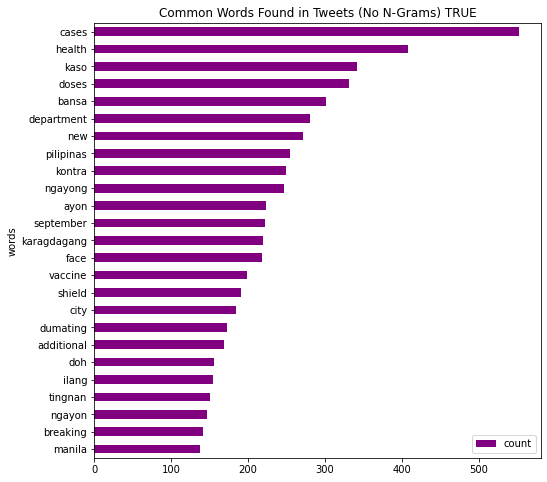

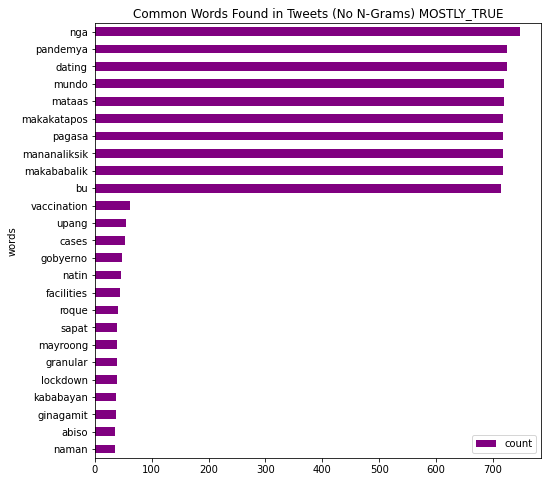

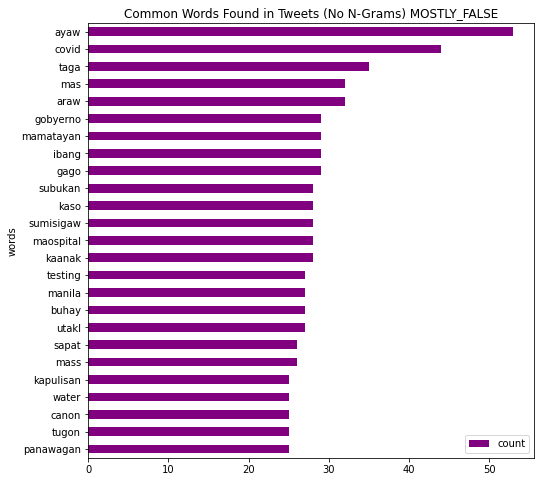

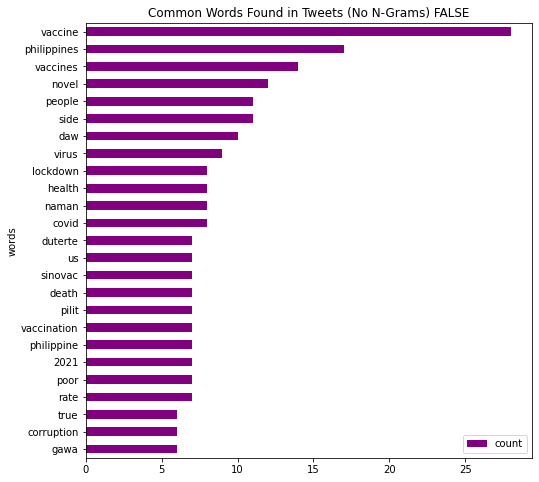

In [ ]:
num = 0

for counts_no_urls in counts:
  clean_tweets_no_urls = pd.DataFrame(counts_no_urls.most_common(25),
                              columns=['words', 'count'])
  fig, ax = plt.subplots(figsize=(8, 8))
  # Plot horizontal bar graph
  clean_tweets_no_urls.sort_values(by='count').plot.barh(x='words',
                        y='count',
                        ax=ax,
                        color="purple")

  ax.set_title("Common Words Found in Tweets (No N-Grams) " + str(verdicts[num]))
  ax.plot(1,num)
  num += 1
  plt.show()

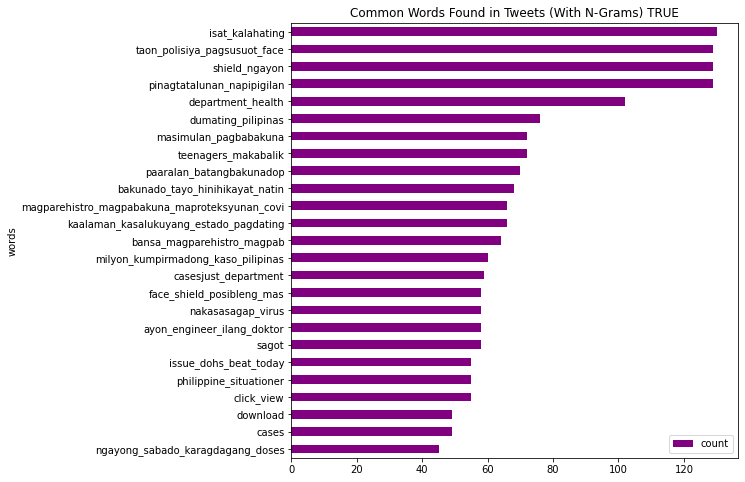

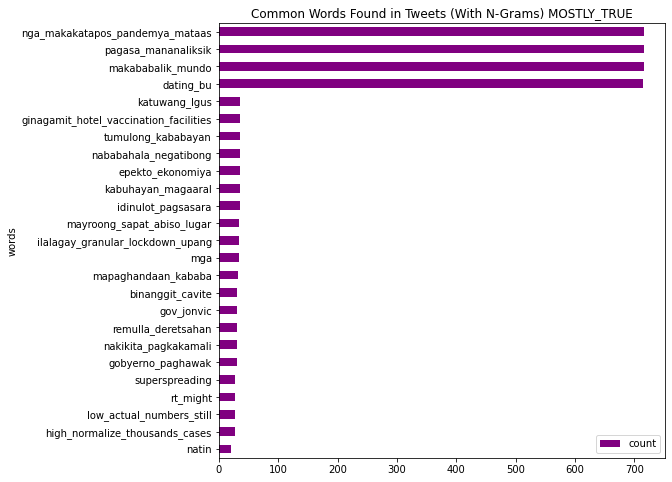

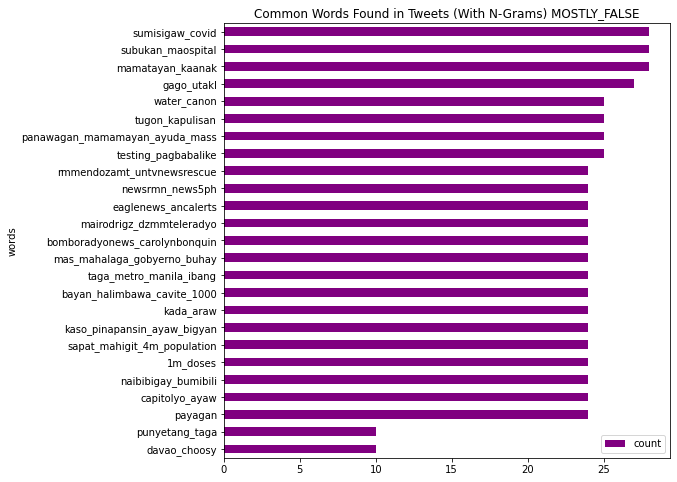

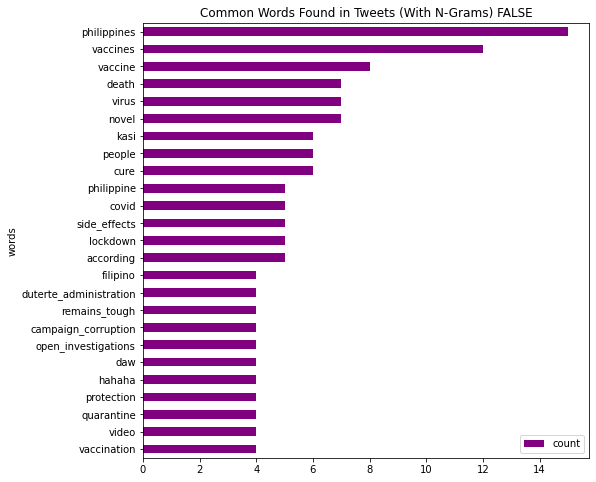

In [ ]:
num = 0

for counts_no_urls in counts_ngram:
  clean_tweets_no_urls = pd.DataFrame(counts_no_urls.most_common(25),
                              columns=['words', 'count'])
  fig, ax = plt.subplots(figsize=(8, 8))
  # Plot horizontal bar graph
  clean_tweets_no_urls.sort_values(by='count').plot.barh(x='words',
                        y='count',
                        ax=ax,
                        color="purple")

  ax.set_title("Common Words Found in Tweets (With N-Grams) " + str(verdicts_ngram[num]))
  ax.plot(1,num)
  num += 1
  plt.show()

### GPU Performance Boost

In [ ]:
%tensorflow_version 2.x
import tensorflow as tf
device_name = tf.test.gpu_device_name()
#device_name = '/TPU:0'
if device_name != '/device:GPU:0':
#if device_name != '/TPU:0':
  raise SystemError('GPU device not found')
print('Found GPU at: {}'.format(device_name))

SystemError: ignored

### TPU Performance

In [38]:
rsn = 42

In [39]:
import tensorflow as tf

try:
  tpu = tf.distribute.cluster_resolver.TPUClusterResolver()  # TPU detection
  print('Running on TPU ', tpu.cluster_spec().as_dict()['worker'])
except ValueError:
  raise BaseException('ERROR: Not connected to a TPU runtime; please see the previous cell in this notebook for instructions!')

tf.config.experimental_connect_to_cluster(tpu)
tf.tpu.experimental.initialize_tpu_system(tpu)
tpu_strategy = tf.distribute.experimental.TPUStrategy(tpu)

#batch_size=32 * tpu_strategy.num_replicas_in_sync
#batch_size = 64
batch_size = 16
print('Batch size:', batch_size)
AUTOTUNE = tf.data.experimental.AUTOTUNE

Running on TPU  ['10.98.90.114:8470']
INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.


INFO:tensorflow:Deallocate tpu buffers before initializing tpu system.


INFO:tensorflow:Initializing the TPU system: grpc://10.98.90.114:8470


INFO:tensorflow:Initializing the TPU system: grpc://10.98.90.114:8470


INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Finished initializing TPU system.


INFO:tensorflow:Found TPU system:


INFO:tensorflow:Found TPU system:


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Cores: 8


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Workers: 1


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Num TPU Cores Per Worker: 8


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:localhost/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:CPU:0, CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:0, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:1, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:2, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:3, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:4, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:5, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:6, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU:7, TPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:TPU_SYSTEM:0, TPU_SYSTEM, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 0, 0)


INFO:tensorflow:*** Available Device: _DeviceAttributes(/job:worker/replica:0/task:0/device:XLA_CPU:0, XLA_CPU, 0, 0)


Batch size: 16


### Model

In [ ]:
label_names = label_names['verdict']

In [ ]:
X = df.tfidf.tolist()
y = df.verdict

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.40, random_state=rsn)

#rus = RandomUnderSampler(sampling_strategy={4:500}, random_state=42) 
#X_train, y_train = rus.fit_resample(X_train, y_train)

oversample = SMOTE(random_state=rsn)
X_train, y_train = oversample.fit_resample(X_train, y_train)

X_train = np.asarray(X_train)
y_train = np.asarray(y_train)

In [ ]:
pycaret_df = df_wordcloud.copy()
pycaret_df = pd.concat([pycaret_df,df.verdict], axis=1)

In [ ]:
#with tf.device(device_name):
from pycaret.classification import *
pyModel = setup(data = pycaret_df, target = 'verdict', session_id=rsn, train_size=0.6, fix_imbalance=True, fold=5, use_gpu=True, numeric_features=df_wordcloud.columns.tolist()) 

,Description,Value
0,session_id,42
1,Target,verdict
2,Target Type,Multiclass
3,Label Encoded,None
4,Original Data,"(4867, 6315)"
5,Missing Values,False
6,Numeric Features,6314
7,Categorical Features,0
8,Ordinal Features,False
9,High Cardinality Features,False


In [ ]:
start = time.time()
best = compare_models()
stop = time.time()
print(f"Training time: {stop - start}s")

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
svm,SVM - Linear Kernel,0.9216,0.0000,0.7852,0.9203,0.9200,0.8411,0.8420,6.018
ridge,Ridge Classifier,0.9168,0.0000,0.7843,0.9164,0.9159,0.8325,0.8331,6.930
et,Extra Trees Classifier,0.9144,0.9841,0.7467,0.9126,0.9115,0.8240,0.8266,11.982
rf,Random Forest Classifier,0.9134,0.9820,0.7130,0.9098,0.9081,0.8199,0.8236,9.244
lightgbm,Light Gradient Boosting Machine,0.9055,0.9753,0.7108,0.9015,0.9004,0.8055,0.8073,7.344
lr,Logistic Regression,0.9041,0.9818,0.7730,0.9082,0.9043,0.8068,0.8084,22.328
dt,Decision Tree Classifier,0.8955,0.8947,0.7136,0.8922,0.8924,0.7878,0.7888,6.250
nb,Naive Bayes,0.8945,0.8898,0.7144,0.8925,0.8896,0.7848,0.7859,4.836
gbc,Gradient Boosting Classifier,0.8801,0.9624,0.6342,0.8760,0.8705,0.7453,0.7528,68.020
lda,Linear Discriminant Analysis,0.8668,0.9021,0.7204,0.8945,0.8761,0.7478,0.7519,77.316


Training time: 1476.465408563614s


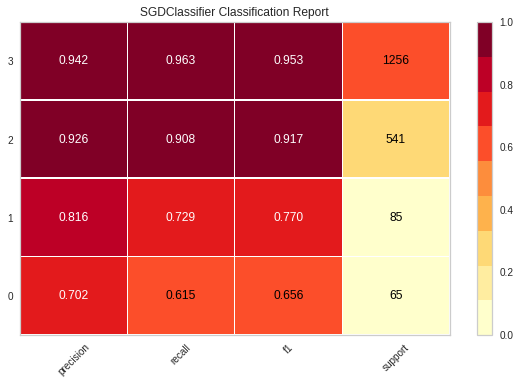

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
model = create_model('svm')
plot_model(model, plot = 'class_report')

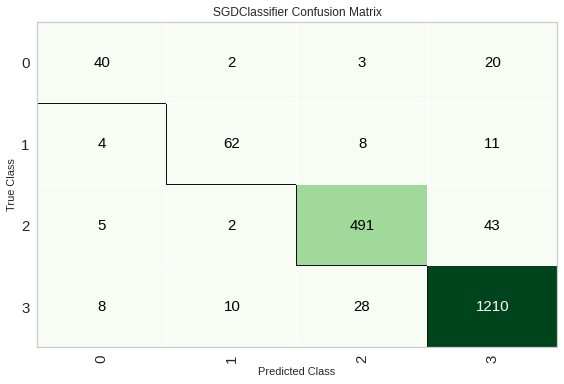

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(model, plot = 'confusion_matrix')

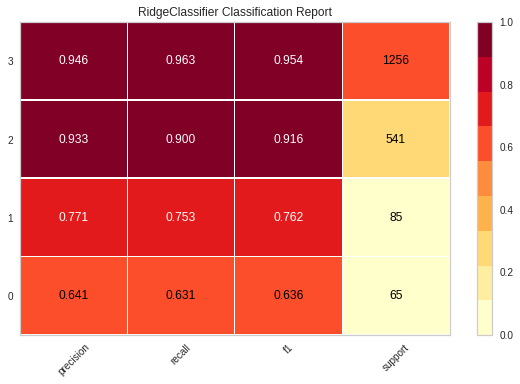

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
model = create_model('ridge')
plot_model(model, plot = 'class_report')

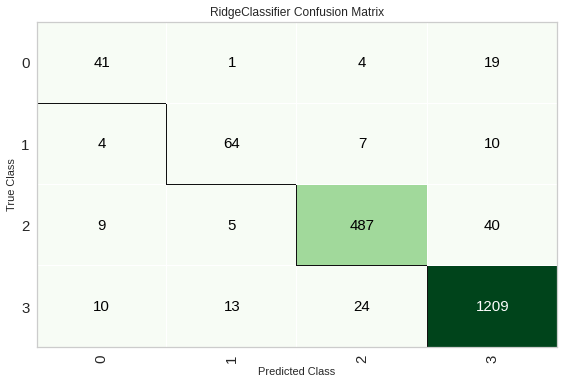

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
plot_model(model, plot = 'confusion_matrix')

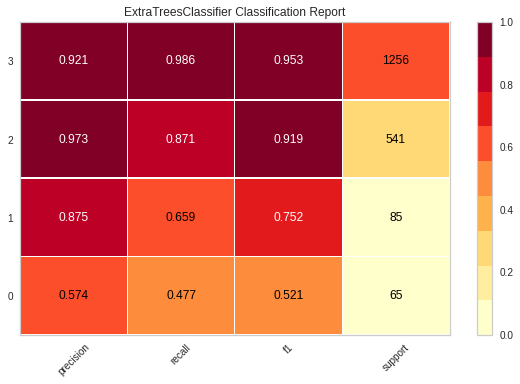

In [ ]:
model = create_model('et')
plot_model(model, plot = 'class_report')

### Model NGram


[TFIDF](https://python.gotrained.com/tf-idf-twitter-sentiment-analysis/)
[SMOTE](https://medium.com/analytics-vidhya/re-sampling-imbalanced-training-corpus-for-sentiment-analysis-c9dc97f9eae1)

In [ ]:
label_names_ngram = label_names_ngram['verdict']

In [ ]:
#X = df.loc[:, df.columns != 'verdict']
X_ngram = df_ngram.tfidf.tolist()
y_ngram = df_ngram.verdict

X_train, X_test, y_train, y_test = train_test_split(X_ngram, y_ngram, test_size=0.40, random_state=rsn)

#rus = RandomUnderSampler(sampling_strategy={4:500}, random_state=42) 
#X_train, y_train = rus.fit_resample(X_train, y_train)

oversample = SMOTE(random_state=rsn)
X_train, y_train = oversample.fit_resample(X_train, y_train)

X_train = np.asarray(X_train)
y_train = np.asarray(y_train)

In [ ]:
pycaret_df_ngram = df_wordcloud_ngram.copy()
pycaret_df_ngram = pd.concat([pycaret_df_ngram,df_ngram.verdict], axis=1)

In [ ]:
#with tf.device(device_name):
from pycaret.classification import *
pyModelNgram = setup(data = pycaret_df_ngram, target = 'verdict', session_id=rsn, train_size=0.6, fix_imbalance=True, fold=5, use_gpu=True, numeric_features=df_wordcloud_ngram.columns.tolist()) 
#best_ngram = compare_models()

,Model,Accuracy,AUC,Recall,Prec.,F1,Kappa,MCC,TT (Sec)
svm,SVM - Linear Kernel,0.8182,0.0000,0.7446,0.8572,0.8250,0.6685,0.6868,8.202
et,Extra Trees Classifier,0.8024,0.9208,0.7191,0.8469,0.8104,0.6412,0.6610,19.360
ridge,Ridge Classifier,0.7983,0.0000,0.7316,0.8504,0.8064,0.6377,0.6632,7.766
rf,Random Forest Classifier,0.7976,0.9193,0.6949,0.8472,0.8046,0.6318,0.6560,14.400
lda,Linear Discriminant Analysis,0.7942,0.8887,0.6810,0.8357,0.7999,0.6212,0.6406,66.108
dt,Decision Tree Classifier,0.7908,0.8756,0.6612,0.8383,0.7970,0.6175,0.6405,9.628
lr,Logistic Regression,0.7664,0.9188,0.7046,0.8415,0.7762,0.5902,0.6274,21.816
knn,K Neighbors Classifier,0.6682,0.8151,0.6888,0.7688,0.6807,0.4350,0.4729,35.738
nb,Naive Bayes,0.6548,0.7882,0.5976,0.8259,0.7084,0.4246,0.4633,6.004
gbc,Gradient Boosting Classifier,0.6281,0.8167,0.5901,0.8086,0.6374,0.3947,0.4784,71.446


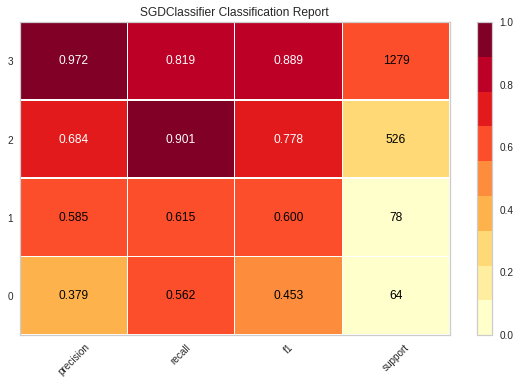

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
model = create_model('svm')
plot_model(model, plot = 'class_report')

In [ ]:
plot_model(model, plot = 'confusion_matrix')

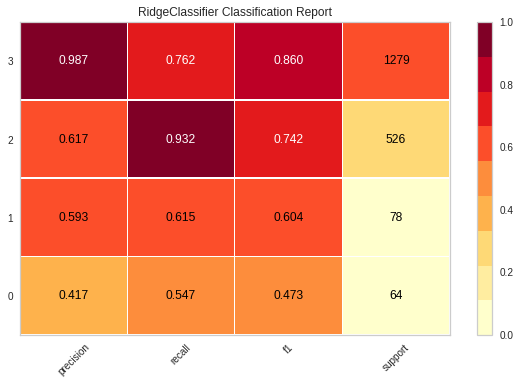

INFO:logs:Visual Rendered Successfully
INFO:logs:plot_model() succesfully completed......................................


In [ ]:
model = create_model('ridge')
plot_model(model, plot = 'class_report')

In [ ]:
plot_model(model, plot = 'confusion_matrix')

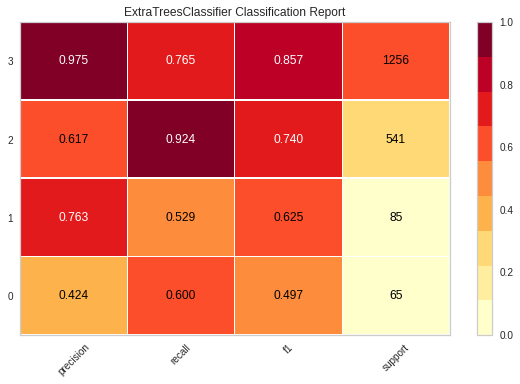

In [ ]:
model = create_model('et')
plot_model(model, plot = 'class_report')

### TF Imports

In [40]:
from keras.layers import Dropout, Dense, Embedding, LSTM, Bidirectional
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.models import Sequential
from keras.callbacks import EarlyStopping, ModelCheckpoint
from keras import regularizers
from sklearn.metrics import matthews_corrcoef, confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn import metrics
from sklearn.utils import shuffle
import numpy as np
import pickle
import matplotlib.pyplot as plt
import warnings
import logging
logging.basicConfig(level=logging.INFO)

### Model (CNN BiLSTM)

In [55]:
X = df.tweet
y = df.verdict

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.40, random_state=rsn)

#oversample = SMOTE(random_state=rsn)
#X_train_Glove, y_train = oversample.fit_resample(X_train, y_train)

In [57]:
#Hyperparameters
EMBEDDING_DIMENSION = 64
VOCABULARY_SIZE = 2000
MAX_LENGTH = 280
OOV_TOK = '<OOV>' #This is to put a special value in when an unseen word is encountered
TRUNCATE_TYPE = 'post'
PADDING_TYPE = 'post'
num_epochs = 25
early_stopping = EarlyStopping(monitor='loss', mode='min', patience=5)
best_model_filename = '/content/best_model_bilstn.h5'
model_checkpoint = ModelCheckpoint(filepath=best_model_filename, monitor='loss', save_best_only=True)

#Tokenize the data and building word_index from it (containing top VOCABULARY_SIZE words)
tokenizer = Tokenizer(num_words=VOCABULARY_SIZE, oov_token=OOV_TOK)
tokenizer.fit_on_texts(list(X_train) + list(X_test))

#Create sequences from tokens
xtrain_sequences = tokenizer.texts_to_sequences(X_train)
xtest_sequences = tokenizer.texts_to_sequences(X_test)
word_index = tokenizer.word_index

#Pad so that all sequences are of length=MAX_LENGTH
xtrain_pad = pad_sequences(xtrain_sequences, maxlen=MAX_LENGTH, padding=PADDING_TYPE, truncating=TRUNCATE_TYPE)
xtest_pad = pad_sequences(xtest_sequences, maxlen=MAX_LENGTH, padding=PADDING_TYPE, truncating=TRUNCATE_TYPE)

#y
training_label_seq = y_train
test_label_seq = y_test

#Create Bi-LSTM
with tpu_strategy.scope():
  model = Sequential()
  model.add(Embedding(len(word_index), EMBEDDING_DIMENSION))
  model.add(Bidirectional(LSTM(EMBEDDING_DIMENSION, kernel_regularizer=regularizers.l2(0.001), dropout=0.1, recurrent_dropout=0.1)))
  model.add(Dense(256, kernel_regularizer=regularizers.l2(0.001), activation='relu'))
#model.add(Dense(4, activation='relu'))

model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

with tpu_strategy.scope():
  start = time.time()
  history = model.fit(xtrain_pad, training_label_seq, epochs=num_epochs, validation_split=0.5, verbose=2, callbacks=[model_checkpoint])
  stop = time.time()
  print(f"Training time: {stop - start}s")
  predicted = model.predict(xtest_pad)
  y_prediction = np.argmax (predicted, axis = 1)
  print(classification_report(y_test,y_prediction))  
  print(accuracy_score(y_test, y_prediction))

Epoch 1/25
46/46 - 28s - loss: 2.1997 - accuracy: 0.6233 - val_loss: 1.0558 - val_accuracy: 0.6295 - 28s/epoch - 609ms/step
Epoch 2/25
46/46 - 5s - loss: 0.8063 - accuracy: 0.7493 - val_loss: 0.7190 - val_accuracy: 0.8568 - 5s/epoch - 108ms/step
Epoch 3/25
46/46 - 5s - loss: 0.4590 - accuracy: 0.9110 - val_loss: 0.6940 - val_accuracy: 0.8870 - 5s/epoch - 107ms/step
Epoch 4/25
46/46 - 5s - loss: 0.3125 - accuracy: 0.9555 - val_loss: 1.1186 - val_accuracy: 0.8945 - 5s/epoch - 107ms/step
Epoch 5/25
46/46 - 5s - loss: 0.6017 - accuracy: 0.9301 - val_loss: 2.6371 - val_accuracy: 0.5979 - 5s/epoch - 106ms/step
Epoch 6/25
46/46 - 5s - loss: 1.5751 - accuracy: 0.7555 - val_loss: 1.8161 - val_accuracy: 0.7363 - 5s/epoch - 105ms/step
Epoch 7/25
46/46 - 5s - loss: 0.8314 - accuracy: 0.8938 - val_loss: 1.5152 - val_accuracy: 0.7945 - 5s/epoch - 105ms/step
Epoch 8/25
46/46 - 5s - loss: 0.9462 - accuracy: 0.8945 - val_loss: 0.7670 - val_accuracy: 0.8788 - 5s/epoch - 105ms/step
Epoch 9/25
46/46 - 5s 

### Roberta

In [46]:
import transformers
from transformers import AutoTokenizer, TFAutoModelForSequenceClassification, RobertaTokenizer, RobertaForSequenceClassification,TFRobertaForSequenceClassification, TFRobertaModel

In [47]:
X = df.tweet
y = df.verdict

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.40, random_state=rsn)

In [48]:
MAX_LEN = 280
MODEL_NAME = "jcblaise/roberta-tagalog-base"

def roberta_encode(texts, tokenizer):
    ct = len(texts)
    input_ids = np.ones((ct, MAX_LEN), dtype='int32')
    attention_mask = np.zeros((ct, MAX_LEN), dtype='int32')
    token_type_ids = np.zeros((ct, MAX_LEN), dtype='int32') # Not used in text classification

    for k, text in enumerate(texts):
        # Tokenize
        tok_text = tokenizer.tokenize(text)
        
        # Truncate and convert tokens to numerical IDs
        enc_text = tokenizer.convert_tokens_to_ids(tok_text[:(MAX_LEN-2)])
        
        input_length = len(enc_text) + 2
        input_length = input_length if input_length < MAX_LEN else MAX_LEN
        
        # Add tokens [CLS] and [SEP] at the beginning and the end
        input_ids[k,:input_length] = np.asarray([0] + enc_text + [2], dtype='int32')
        
        # Set to 1s in the attention input
        attention_mask[k,:input_length] = 1

    return {
        'input_word_ids': input_ids,
        'input_mask': attention_mask,
        'input_type_ids': token_type_ids
    }

def build_model(n_categories):
    with tpu_strategy.scope():
        input_word_ids = tf.keras.Input(shape=(MAX_LEN,), dtype=tf.int32, name='input_word_ids')
        input_mask = tf.keras.Input(shape=(MAX_LEN,), dtype=tf.int32, name='input_mask')
        input_type_ids = tf.keras.Input(shape=(MAX_LEN,), dtype=tf.int32, name='input_type_ids')

        # Import RoBERTa model from HuggingFace
        roberta_model = TFRobertaModel.from_pretrained(MODEL_NAME)
        x = roberta_model(input_word_ids, attention_mask=input_mask, token_type_ids=input_type_ids)

        # Huggingface transformers have multiple outputs, embeddings are the first one,
        # so let's slice out the first position
        x = x[0]

        x = tf.keras.layers.Dropout(0.1)(x)
        x = tf.keras.layers.Flatten()(x)
        x = tf.keras.layers.Dense(256, activation='relu')(x)
        x = tf.keras.layers.Dense(n_categories, activation='softmax')(x)

        model = tf.keras.Model(inputs=[input_word_ids, input_mask, input_type_ids], outputs=x)
        model.compile(
            optimizer=tf.keras.optimizers.Adam(lr=1e-5),
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy'])

        return model

In [53]:
tokenizer = RobertaTokenizer.from_pretrained(MODEL_NAME) #Tokenizer
X_train_tk = roberta_encode(X_train, tokenizer)
X_test_tk = roberta_encode(X_test, tokenizer)

early_stopping = EarlyStopping(monitor='loss', mode='min', patience=5)
with tpu_strategy.scope():
  model = build_model(4)
  history = model.fit(X_train_tk,y_train,epochs=50, batch_size=batch_size, validation_data=(X_test_tk, y_test), validation_split=0.5, verbose=1, callbacks=[early_stopping])
  predicted = model.predict(X_test_tk)
  y_prediction = np.argmax (predicted, axis = 1)
  print(classification_report(y_test,y_prediction))  
  print(accuracy_score(y_test, y_prediction))

Some layers from the model checkpoint at jcblaise/roberta-tagalog-base were not used when initializing TFRobertaModel: ['lm_head']
- This IS expected if you are initializing TFRobertaModel from the checkpoint of a model trained on another task or with another architecture (e.g. initializing a BertForSequenceClassification model from a BertForPreTraining model).
- This IS NOT expected if you are initializing TFRobertaModel from the checkpoint of a model that you expect to be exactly identical (initializing a BertForSequenceClassification model from a BertForSequenceClassification model).
Some layers of TFRobertaModel were not initialized from the model checkpoint at jcblaise/roberta-tagalog-base and are newly initialized: ['roberta/pooler/dense/kernel:0', 'roberta/pooler/dense/bias:0']
You should probably TRAIN this model on a down-stream task to be able to use it for predictions and inference.
/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` 

Epoch 1/50


92/92 [==============================] - 121s 274ms/step - loss: 0.5713 - accuracy: 0.8205 - val_loss: 0.3898 - val_accuracy: 0.8774
Epoch 2/50
92/92 [==============================] - 13s 138ms/step - loss: 0.2025 - accuracy: 0.9247 - val_loss: 0.3272 - val_accuracy: 0.9151
Epoch 3/50
92/92 [==============================] - 13s 138ms/step - loss: 0.0922 - accuracy: 0.9705 - val_loss: 0.4415 - val_accuracy: 0.9041
Epoch 4/50
92/92 [==============================] - 13s 137ms/step - loss: 0.0456 - accuracy: 0.9870 - val_loss: 0.4544 - val_accuracy: 0.9027
Epoch 5/50
92/92 [==============================] - 13s 137ms/step - loss: 0.0317 - accuracy: 0.9918 - val_loss: 0.4902 - val_accuracy: 0.9068
Epoch 6/50
92/92 [==============================] - 13s 139ms/step - loss: 0.0220 - accuracy: 0.9932 - val_loss: 0.5894 - val_accuracy: 0.9034
Epoch 7/50
92/92 [==============================] - 13s 139ms/step - loss: 0.0398 - accuracy: 0.9863 - val_loss: 0.6256 - val_accuracy: 0.9041
Epoch 8/5

In [54]:
model.save_weights('/content/roberta-fil-base-v3.h5')

### GPT-20

In [41]:
import transformers
from transformers import AutoTokenizer, TFAutoModel

In [42]:
X = df.tweet
y = df.verdict

X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.40, random_state=rsn)

In [43]:
MAX_LEN = 280
MODEL_NAME = "jcblaise/gpt2-tagalog"

def xlm_encode(texts, tokenizer):
    ct = len(texts)
    input_ids = np.ones((ct, MAX_LEN), dtype='int32')
    attention_mask = np.zeros((ct, MAX_LEN), dtype='int32')
    token_type_ids = np.zeros((ct, MAX_LEN), dtype='int32') # Not used in text classification

    for k, text in enumerate(texts):
        # Tokenize
        tok_text = tokenizer.tokenize(text)
        
        # Truncate and convert tokens to numerical IDs
        enc_text = tokenizer.convert_tokens_to_ids(tok_text[:(MAX_LEN-2)])
        
        input_length = len(enc_text) + 2
        input_length = input_length if input_length < MAX_LEN else MAX_LEN
        
        # Add tokens [CLS] and [SEP] at the beginning and the end
        input_ids[k,:input_length] = np.asarray([0] + enc_text + [2], dtype='int32')
        
        # Set to 1s in the attention input
        attention_mask[k,:input_length] = 1

    return {
        'input_word_ids': input_ids,
        'input_mask': attention_mask,
        'input_type_ids': token_type_ids
    }

def build_model(n_categories):
    with tpu_strategy.scope():
        input_word_ids = tf.keras.Input(shape=(MAX_LEN,), dtype=tf.int32, name='input_word_ids')
        input_mask = tf.keras.Input(shape=(MAX_LEN,), dtype=tf.int32, name='input_mask')
        input_type_ids = tf.keras.Input(shape=(MAX_LEN,), dtype=tf.int32, name='input_type_ids')

        # Import XLM model from HuggingFace
        xlm_model = TFAutoModel.from_pretrained(MODEL_NAME)
        x = xlm_model(input_word_ids, attention_mask=input_mask, token_type_ids=input_type_ids)

        # Huggingface transformers have multiple outputs, embeddings are the first one,
        # so let's slice out the first position
        x = x[0]

        x = tf.keras.layers.Dropout(0.1)(x)
        x = tf.keras.layers.Flatten()(x)
        x = tf.keras.layers.Dense(256, activation='relu')(x)
        x = tf.keras.layers.Dense(n_categories, activation='softmax')(x)

        model = tf.keras.Model(inputs=[input_word_ids, input_mask, input_type_ids], outputs=x)
        model.compile(
            optimizer=tf.keras.optimizers.Adam(lr=1e-5),
            loss='sparse_categorical_crossentropy',
            metrics=['accuracy'])

        return model

In [44]:
tokenizer = AutoTokenizer.from_pretrained(MODEL_NAME) #Tokenizer
X_train_tk = xlm_encode(X_train, tokenizer)
X_test_tk = xlm_encode(X_test, tokenizer)

early_stopping = EarlyStopping(monitor='loss', mode='min', patience=5)
with tpu_strategy.scope():
  model = build_model(5)
  history = model.fit(X_train_tk,y_train,epochs=50, batch_size=batch_size, validation_data=(X_test_tk, y_test), validation_split=0.5, verbose=1, callbacks=[early_stopping])
  predicted = model.predict(X_test_tk)
  y_prediction = np.argmax (predicted, axis = 1)
  print(classification_report(y_test,y_prediction))  
  print(accuracy_score(y_test, y_prediction))

Downloading:   0%|          | 0.00/542 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/664 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/498k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/290k [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/357 [00:00<?, ?B/s]

Downloading:   0%|          | 0.00/421M [00:00<?, ?B/s]

All model checkpoint layers were used when initializing TFGPT2Model.

All the layers of TFGPT2Model were initialized from the model checkpoint at jcblaise/gpt2-tagalog.
If your task is similar to the task the model of the checkpoint was trained on, you can already use TFGPT2Model for predictions without further training.
/usr/local/lib/python3.7/dist-packages/keras/optimizer_v2/adam.py:105: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super(Adam, self).__init__(name, **kwargs)


Epoch 1/50
92/92 [==============================] - 106s 241ms/step - loss: 0.9675 - accuracy: 0.7712 - val_loss: 0.8184 - val_accuracy: 0.7952
Epoch 2/50
92/92 [==============================] - 13s 137ms/step - loss: 0.5075 - accuracy: 0.8308 - val_loss: 0.6940 - val_accuracy: 0.7247
Epoch 3/50
92/92 [==============================] - 13s 139ms/step - loss: 0.4495 - accuracy: 0.8459 - val_loss: 0.4561 - val_accuracy: 0.8589
Epoch 4/50
92/92 [==============================] - 13s 137ms/step - loss: 0.2466 - accuracy: 0.9164 - val_loss: 0.4004 - val_accuracy: 0.8699
Epoch 5/50
92/92 [==============================] - 13s 136ms/step - loss: 0.2083 - accuracy: 0.9288 - val_loss: 0.4296 - val_accuracy: 0.8945
Epoch 6/50
92/92 [==============================] - 13s 138ms/step - loss: 0.0827 - accuracy: 0.9692 - val_loss: 0.7257 - val_accuracy: 0.8836
Epoch 7/50
92/92 [==============================] - 13s 137ms/step - loss: 0.0779 - accuracy: 0.9733 - val_loss: 0.5037 - val_accuracy: 0.888

In [45]:
model.save_weights('/content/gpt2-tagalog.h5')

### Old Roberta

In [ ]:
#Hyperparameters
EMBEDDING_DIMENSION = 64
VOCABULARY_SIZE = 2000
MAX_LENGTH = 280
OOV_TOK = '<OOV>' #This is to put a special value in when an unseen word is encountered
TRUNCATE_TYPE = 'post'
PADDING_TYPE = 'post'
num_epochs = 50

tokenizer = RobertaTokenizer.from_pretrained("jcblaise/roberta-tagalog-large") #Tokenizer
inputs_train = tokenizer.batch_encode_plus(list(X_train), padding=True, truncation=True, return_tensors='tf', max_length=MAX_LENGTH) #Tokenized text
inputs_test = tokenizer.batch_encode_plus(list(X_test), padding=True, truncation=True, return_tensors='tf',  max_length=MAX_LENGTH) #Tokenized text
#xtrain_pad = pad_sequences(inputs_train.input_ids, maxlen=MAX_LENGTH, padding=PADDING_TYPE, truncating=TRUNCATE_TYPE)
#xtest_pad = pad_sequences(inputs_test.input_ids, maxlen=MAX_LENGTH, padding=PADDING_TYPE, truncating=TRUNCATE_TYPE)

xtrain_pad = inputs_train.input_ids
xtest_pad = inputs_test.input_ids

early_stopping = EarlyStopping(monitor='loss', mode='min', patience=5)
best_model_filename = '/content/best_model_roberta.ckpt'
model_checkpoint = ModelCheckpoint(filepath=best_model_filename, monitor='loss', save_weights_only=True, save_best_only=True)
#with tf.device(device_name):
with tpu_strategy.scope():
  model = TFRobertaForSequenceClassification.from_pretrained("jcblaise/roberta-tagalog-large", num_labels=5)
  model.compile(loss='sparse_categorical_crossentropy', optimizer=tf.keras.optimizers.Adam(lr=1e-5),, metrics=['accuracy'])
history=model.fit(xtrain_pad, y_train, epochs=50, validation_split=0.5, verbose=2, callbacks=[early_stopping, model_checkpoint])
predicted = model.predict(xtest_pad)
y_prediction = np.argmax (predicted, axis = 1)
print(classification_report(y_test,y_prediction))  
print(accuracy_score(y_test, y_prediction))
 


### Word Cloud No NGram


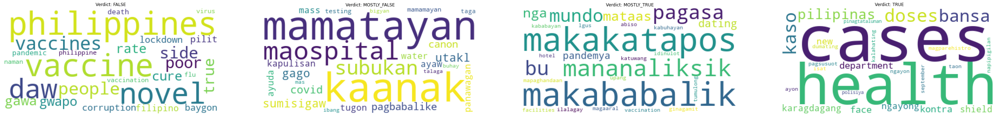

In [ ]:
df_wordcloud_y = pd.concat([df_wordcloud,y], axis=1)
df_wc = []
for i in range(0,4):
  df_wc.append(df_wordcloud_y.loc[df_wordcloud_y.verdict==i])
  df_wc[i] = df_wc[i].drop(columns=['verdict'])
  df_wc[i] = df_wc[i].reset_index()

clouds = []
for df_c in df_wc:
  some_df = df_c.T.drop('index')
  cloud = WordCloud(background_color="white", max_words=25).generate_from_frequencies(some_df.sum(axis=1))
  clouds.append(cloud)

fig, axs = plt.subplots(1, 4, figsize=(50, 50))
for i in range(len(clouds)):
  axs[i].imshow(clouds[i])
  axs[i].axis("off")
  #axs[i].tight_layout(pad = 0)
  for j in label_names['verdict']:
    if i == label_names['verdict'][j]:
      label = j
  axs[i].set_title('Verdict: ' + str(label))
  axs[i].plot(1,i)

plt.show()

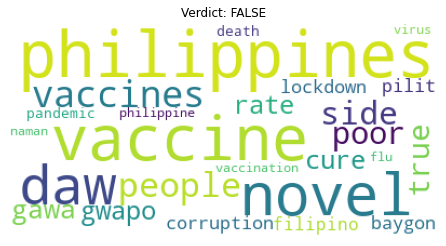

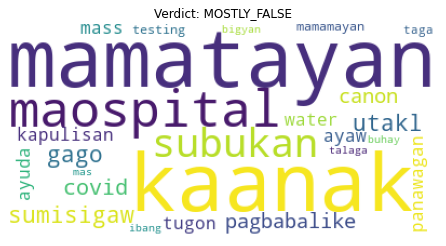

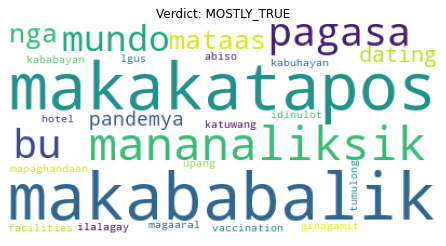

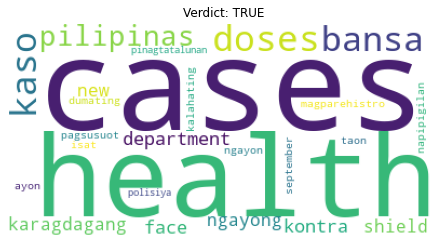

In [ ]:
for i in range(len(clouds)):
  plt.figure(figsize = (7, 3), facecolor = None)
  plt.imshow(clouds[i])
  plt.axis("off")
  plt.tight_layout(pad = 0)
  for j in label_names['verdict']:
    if i == label_names['verdict'][j]:
      label = j
  plt.title('Verdict: ' + str(label))
  
  plt.show()

### Bar Chart No NGram

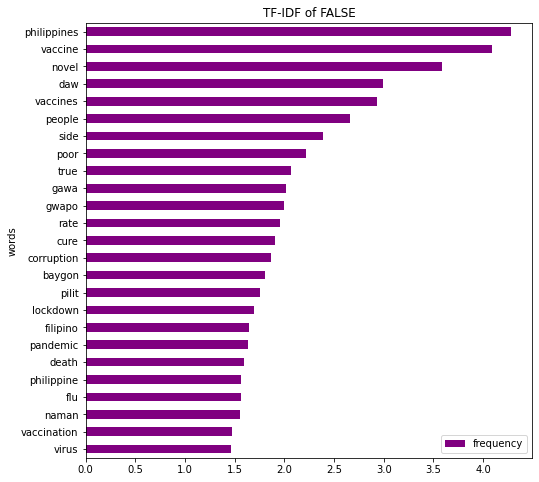

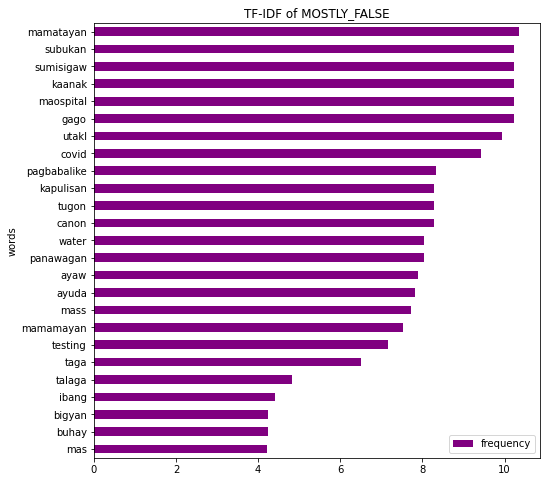

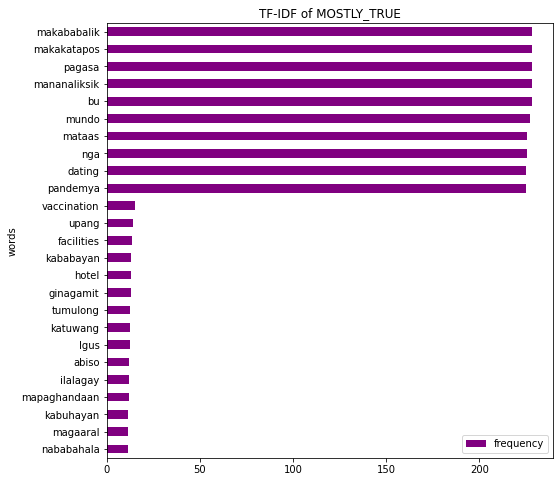

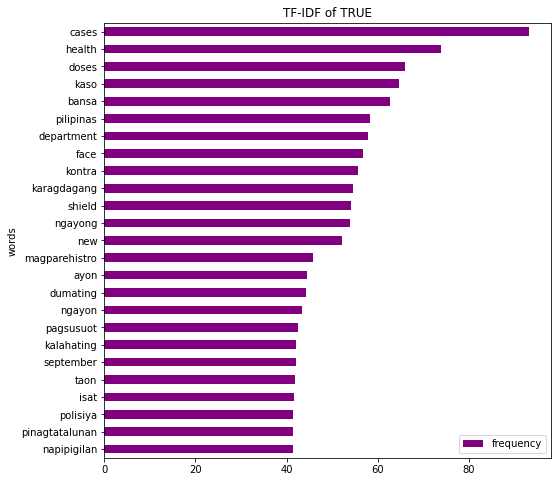

In [ ]:
charts = []
for df_c in df_wc:
  some_df = df_c.T.drop('index')
  some_df = some_df.sum(axis=1).to_dict()
  new_df = pd.DataFrame(columns=['words','frequency'])
  for key, value in some_df.items():
    row = {'words':key,'frequency':value}
    new_df = new_df.append(row,ignore_index=True)
  new_df = new_df.sort_values(by=['frequency'])
  charts.append(new_df)

num = 0

for chart in charts:
  fig, ax = plt.subplots(figsize=(8, 8))
  chart = chart.sort_values(by='frequency', ascending=False)
  chart = chart.head(25)
  # Plot horizontal bar graph
  chart.sort_values(by='frequency').plot.barh(x='words',
                        y='frequency',
                        ax=ax,
                        color="purple")
  for j in label_names['verdict']:
    if num == label_names['verdict'][j]:
      label = j
  ax.set_title("TF-IDF of " + str(label))
  ax.plot(1,num)
  num += 1
  plt.show()

### Word Cloud NGram


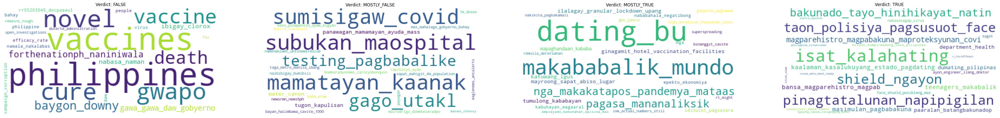

In [ ]:
df_wordcloud_y = pd.concat([df_wordcloud_ngram,y_ngram], axis=1)
df_wc = []
for i in range(0,4):
  df_wc.append(df_wordcloud_y.loc[df_wordcloud_y.verdict==i])
  df_wc[i] = df_wc[i].drop(columns=['verdict'])
  df_wc[i] = df_wc[i].reset_index()

clouds = []
for df_c in df_wc:
  some_df = df_c.T.drop('index')
  cloud = WordCloud(background_color="white", max_words=25).generate_from_frequencies(some_df.sum(axis=1))
  clouds.append(cloud)


fig, axs = plt.subplots(1, 4, figsize=(50, 50))
for i in range(len(clouds)):
  axs[i].imshow(clouds[i])
  axs[i].axis("off")
  #axs[i].tight_layout(pad = 0)
  for j in label_names_ngram['verdict']:
    if i == label_names_ngram['verdict'][j]:
      label = j
  axs[i].set_title('Verdict: ' + str(label))
  axs[i].plot(1,i)

plt.show()

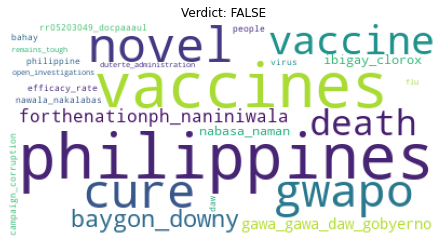

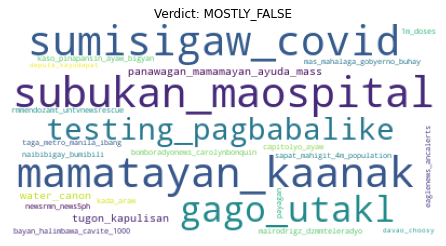

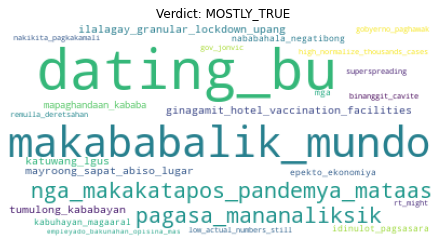

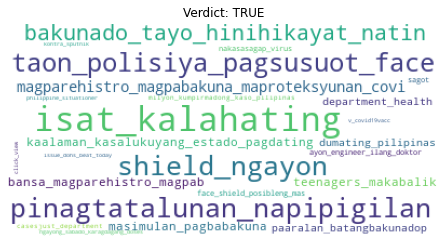

In [ ]:
for i in range(len(clouds)):
  plt.figure(figsize = (7, 3), facecolor = None)
  plt.imshow(clouds[i])
  plt.axis("off")
  plt.tight_layout(pad = 0)
  for j in label_names_ngram['verdict']:
    if i == label_names_ngram['verdict'][j]:
      label = j
  plt.title('Verdict: ' + str(label))
  
  plt.show()

### Bar Chart NGram


In [ ]:
charts = []
for df_c in df_wc:
  some_df = df_c.T.drop('index')
  some_df = some_df.sum(axis=1).to_dict()
  new_df = pd.DataFrame(columns=['words','frequency'])
  for key, value in some_df.items():
    row = {'words':key,'frequency':value}
    new_df = new_df.append(row,ignore_index=True)
  new_df = new_df.sort_values(by=['frequency'])
  charts.append(new_df)

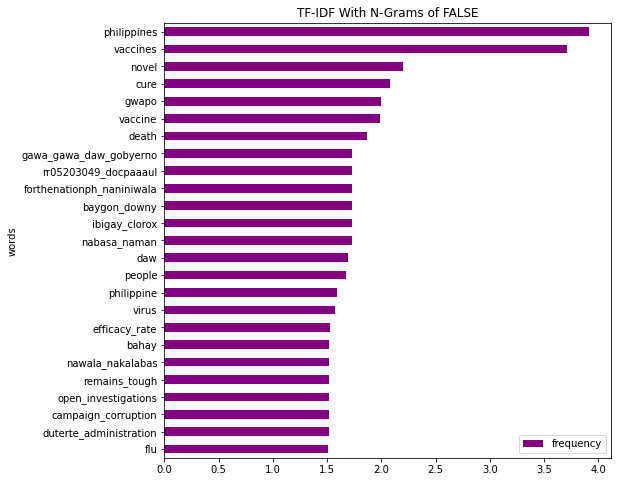

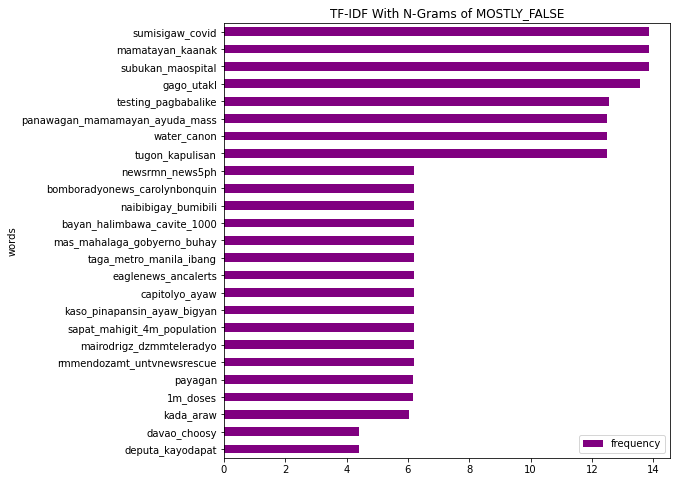

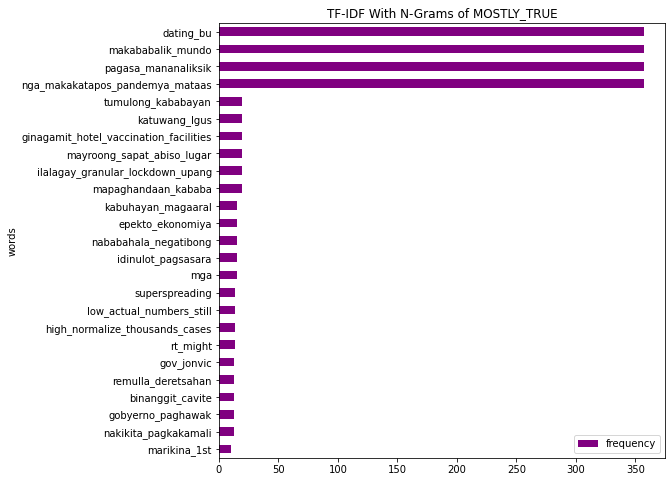

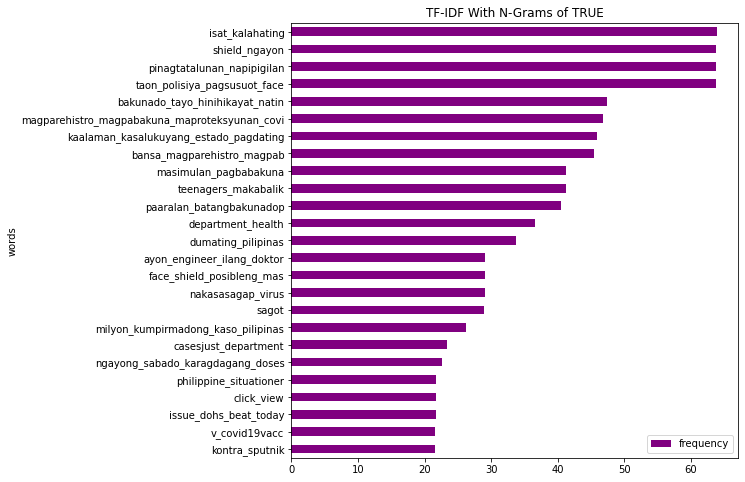

In [ ]:
num = 0

for chart in charts:
  fig, ax = plt.subplots(figsize=(8, 8))
  chart = chart.sort_values(by='frequency', ascending=False)
  chart = chart.head(25)
  # Plot horizontal bar graph
  chart.sort_values(by='frequency').plot.barh(x='words',
                        y='frequency',
                        ax=ax,
                        color="purple")
  for j in label_names_ngram['verdict']:
    if num == label_names_ngram['verdict'][j]:
      label = j
  ax.set_title("TF-IDF With N-Grams of " + str(label))
  ax.plot(1,num)
  num += 1
  plt.show()